In [45]:
# !pip install geopandas
# !pip install folium matplotlib mapclassify
# conda install -c pyviz geoviews

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px #data visualisation
# import descartes
import geopandas as gpd
import folium
from shapely.geometry import Point, Polygon


pd.set_option('display.max_columns', 54)

In [2]:
df = pd.read_csv('./data/ship_clean.csv', encoding= 'unicode_escape')

In [3]:
df.head(2)

,type,actual_ship_days,estimated_ship_days,delivery_status,late_delivery_risk,category_id,category_name,customer_city,customer_id,customer_segment,customer_state,customer_zipcode,department_name,latitude,longitude,market,order_city,order_country,order_date,order_id,order_item_discount_rate,order_item_profit_ratio,order_item_quantity,order_region,order_state,order_status,product_card_id,product_name,product_price,shipping_date,shipping_mode
0,DEBIT,3,4,Advance shipping,0,73,Sporting Goods,Caguas,20755,Consumer,PR,725.0,Fitness,18.251453,-66.037056,Pacific Asia,Bekasi,Indonesia,2018-01-31 22:56:00,77202,0.04,0.29,1,Southeast Asia,Java Occidental,COMPLETE,1360,Smart watch,327.75,2018-02-03 22:56:00,Standard Class
1,TRANSFER,5,4,Late delivery,1,73,Sporting Goods,Caguas,19492,Consumer,PR,725.0,Fitness,18.279451,-66.037064,Pacific Asia,Bikaner,India,2018-01-13 12:27:00,75939,0.05,-0.80,1,South Asia,Rajastï¿½n,PENDING,1360,Smart watch,327.75,2018-01-18 12:27:00,Standard Class


In [5]:
df['order_country'].value_counts()

Estados Unidos         24840
Francia                13222
Mï¿½xico               13172
Alemania                9564
Australia               8497
                       ...  
Kuwait                     2
Sï¿½hara Occidental        2
Eritrea                    2
Burundi                    1
Serbia                     1
Name: order_country, Length: 164, dtype: int64

# GeoMapping

In [5]:
new_york_df = df.loc[df['customer_state'] == 'NY']

In [6]:
df.loc[df['order_country'] == 'China']

,type,actual_ship_days,estimated_ship_days,delivery_status,late_delivery_risk,category_id,category_name,customer_city,customer_id,customer_segment,customer_state,customer_zipcode,department_name,latitude,longitude,market,order_city,order_country,order_date,order_id,order_item_discount_rate,order_item_profit_ratio,order_item_quantity,order_region,order_state,order_status,product_card_id,product_name,product_price,shipping_date,shipping_mode
6,DEBIT,2,1,Late delivery,1,73,Sporting Goods,Caguas,19487,Home Office,PR,725.0,Fitness,18.242538,-66.037056,Pacific Asia,Guangzhou,China,2018-01-13 10:42:00,75934,0.12,0.33,1,Eastern Asia,Guangdong,COMPLETE,1360,Smart watch,327.750000,2018-01-15 10:42:00,First Class
7,TRANSFER,2,1,Late delivery,1,73,Sporting Goods,Miami,19486,Corporate,FL,33162.0,Fitness,25.928869,-80.162872,Pacific Asia,Guangzhou,China,2018-01-13 10:21:00,75933,0.13,0.24,1,Eastern Asia,Guangdong,PROCESSING,1360,Smart watch,327.750000,2018-01-15 10:21:00,First Class
8,CASH,3,2,Late delivery,1,73,Sporting Goods,Caguas,19485,Corporate,PR,725.0,Fitness,18.233223,-66.037056,Pacific Asia,Guangzhou,China,2018-01-13 10:00:00,75932,0.15,0.48,1,Eastern Asia,Guangdong,CLOSED,1360,Smart watch,327.750000,2018-01-16 10:00:00,Second Class
9,CASH,2,1,Late delivery,1,73,Sporting Goods,San Ramon,19484,Corporate,CA,94583.0,Fitness,37.773991,-121.966629,Pacific Asia,Guangzhou,China,2018-01-13 09:39:00,75931,0.16,0.48,1,Eastern Asia,Guangdong,CLOSED,1360,Smart watch,327.750000,2018-01-15 09:39:00,First Class
27,PAYMENT,4,4,Shipping on time,0,73,Sporting Goods,Caguas,19466,Corporate,PR,725.0,Fitness,18.270224,-66.037064,Pacific Asia,Guilin,China,2018-01-13 03:21:00,75913,0.16,0.30,1,Eastern Asia,Guangxi,PENDING_PAYMENT,1360,Smart watch,327.750000,2018-01-17 03:21:00,Standard Class
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180510,PAYMENT,3,4,Advance shipping,0,45,Fishing,Caguas,7,Corporate,PR,725.0,Fan Shop,18.359095,-66.079956,Pacific Asia,Guangshui,China,2016-01-16 06:49:00,26052,0.17,0.50,1,Eastern Asia,Hubei,PENDING_PAYMENT,1004,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,2016-01-19 06:49:00,Standard Class
180511,DEBIT,2,2,Shipping on time,0,45,Fishing,Chula Vista,9314,Consumer,CA,91911.0,Fan Shop,32.611141,-117.073662,Pacific Asia,Chengdu,China,2016-01-16 06:28:00,26051,0.18,0.48,1,Eastern Asia,Sichuan,ON_HOLD,1004,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,2016-01-18 06:28:00,Second Class
180512,DEBIT,6,4,Late delivery,1,45,Fishing,Caguas,7396,Home Office,PR,725.0,Fan Shop,18.245256,-66.370621,Pacific Asia,Chengdu,China,2016-01-16 06:07:00,26050,0.20,0.27,1,Eastern Asia,Sichuan,COMPLETE,1004,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,2016-01-22 06:07:00,Standard Class
180513,PAYMENT,3,4,Advance shipping,0,45,Fishing,Lancaster,3080,Home Office,OH,43130.0,Fan Shop,39.715977,-82.599297,Pacific Asia,Shanghï¿½i,China,2016-01-16 05:04:00,26047,0.25,0.40,1,Eastern Asia,Shanghï¿½i,PENDING_PAYMENT,1004,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,2016-01-19 05:04:00,Standard Class


In [7]:
# df['geometry'].value_counts()

In [8]:
# import street map
street_map = gpd.read_file('./countries/ne_110m_admin_0_countries.shp')

In [14]:
# designate coordinate system
crs='EPSG:4326'
# zip x and y coordinates into single feature
geometry = [Point(xy) for xy in zip(df['longitude'], df['latitude'])]
# create GeoPandas dataframe
geo_df = gpd.GeoDataFrame(df,
 crs = crs,
 geometry = geometry)

In [15]:
geo_df

,type,actual_ship_days,estimated_ship_days,delivery_status,late_delivery_risk,category_id,category_name,customer_city,customer_id,customer_segment,customer_state,customer_zipcode,department_name,latitude,longitude,market,order_city,order_country,order_date,order_id,order_item_discount_rate,order_item_profit_ratio,order_item_quantity,order_region,order_state,order_status,product_card_id,product_name,product_price,shipping_date,shipping_mode,geometry
0,DEBIT,3,4,Advance shipping,0,73,Sporting Goods,Caguas,20755,Consumer,PR,725.0,Fitness,18.251453,-66.037056,Pacific Asia,Bekasi,Indonesia,2018-01-31 22:56:00,77202,0.04,0.29,1,Southeast Asia,Java Occidental,COMPLETE,1360,Smart watch,327.750000,2018-02-03 22:56:00,Standard Class,POINT (-66.03706 18.25145)
1,TRANSFER,5,4,Late delivery,1,73,Sporting Goods,Caguas,19492,Consumer,PR,725.0,Fitness,18.279451,-66.037064,Pacific Asia,Bikaner,India,2018-01-13 12:27:00,75939,0.05,-0.80,1,South Asia,Rajastï¿½n,PENDING,1360,Smart watch,327.750000,2018-01-18 12:27:00,Standard Class,POINT (-66.03706 18.27945)
2,CASH,4,4,Shipping on time,0,73,Sporting Goods,San Jose,19491,Consumer,CA,95125.0,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,2018-01-13 12:06:00,75938,0.06,-0.80,1,South Asia,Rajastï¿½n,CLOSED,1360,Smart watch,327.750000,2018-01-17 12:06:00,Standard Class,POINT (-121.88128 37.29223)
3,DEBIT,3,4,Advance shipping,0,73,Sporting Goods,Los Angeles,19490,Home Office,CA,90027.0,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,2018-01-13 11:45:00,75937,0.07,0.08,1,Oceania,Queensland,COMPLETE,1360,Smart watch,327.750000,2018-01-16 11:45:00,Standard Class,POINT (-118.29102 34.12595)
4,PAYMENT,2,4,Advance shipping,0,73,Sporting Goods,Caguas,19489,Corporate,PR,725.0,Fitness,18.253769,-66.037048,Pacific Asia,Townsville,Australia,2018-01-13 11:24:00,75936,0.09,0.45,1,Oceania,Queensland,PENDING_PAYMENT,1360,Smart watch,327.750000,2018-01-15 11:24:00,Standard Class,POINT (-66.03705 18.25377)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180514,CASH,4,4,Shipping on time,0,45,Fishing,Brooklyn,1005,Home Office,NY,11207.0,Fan Shop,40.640930,-73.942711,Pacific Asia,Shanghï¿½i,China,2016-01-16 03:40:00,26043,0.00,0.10,1,Eastern Asia,Shanghï¿½i,CLOSED,1004,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,2016-01-20 03:40:00,Standard Class,POINT (-73.94271 40.64093)
180515,DEBIT,3,2,Late delivery,1,45,Fishing,Bakersfield,9141,Corporate,CA,93304.0,Fan Shop,35.362545,-119.018700,Pacific Asia,Hirakata,Japï¿½n,2016-01-16 01:34:00,26037,0.01,-1.55,1,Eastern Asia,Osaka,COMPLETE,1004,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,2016-01-19 01:34:00,Second Class,POINT (-119.01870 35.36255)
180516,TRANSFER,5,4,Late delivery,1,45,Fishing,Bristol,291,Corporate,CT,6010.0,Fan Shop,41.629959,-72.967155,Pacific Asia,Adelaide,Australia,2016-01-15 21:00:00,26024,0.02,0.36,1,Oceania,Australia del Sur,PENDING,1004,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,2016-01-20 21:00:00,Standard Class,POINT (-72.96716 41.62996)
180517,PAYMENT,3,4,Advance shipping,0,45,Fishing,Caguas,2813,Consumer,PR,725.0,Fan Shop,18.213350,-66.370575,Pacific Asia,Adelaide,Australia,2016-01-15 20:18:00,26022,0.03,0.48,1,Oceania,Australia del Sur,PENDING_PAYMENT,1004,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,2016-01-18 20:18:00,Standard Class,POINT (-66.37057 18.21335)


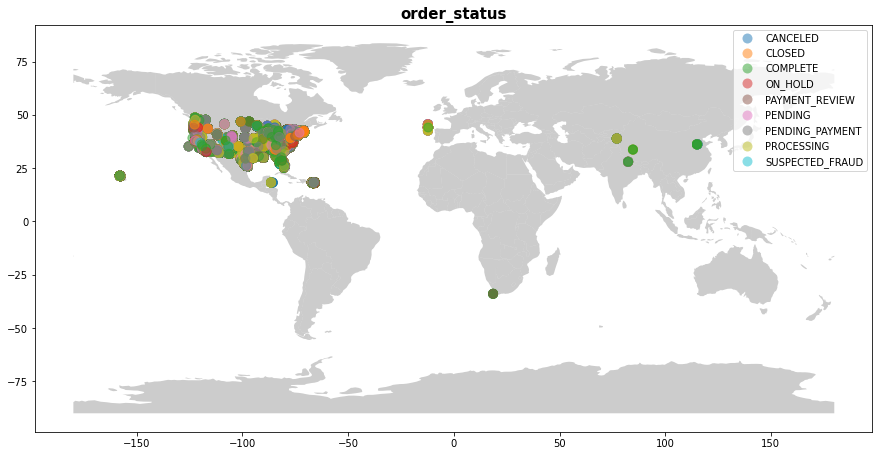

In [10]:
# create figure and axes, assign to subplot
# fig, ax = plt.subplots(figsize=(15,15))

# # add .shp mapfile to axes
# street_map.plot(ax=ax, alpha=0.4,color='grey')

# # add geodataframe to axes
# # assign ‘price’ variable to represent coordinates on graph
# # add legend
# # make datapoints transparent using alpha
# # assign size of points using markersize
# geo_df.plot(column='order_status',ax=ax,alpha=0.5, legend=True,markersize=80)

# # add title to graph
# plt.title('order_status', fontsize=15,fontweight='bold')
# # set latitiude and longitude boundaries for map display
# # plt.xlim()
# # plt.ylim()
# # show map
# plt.show()

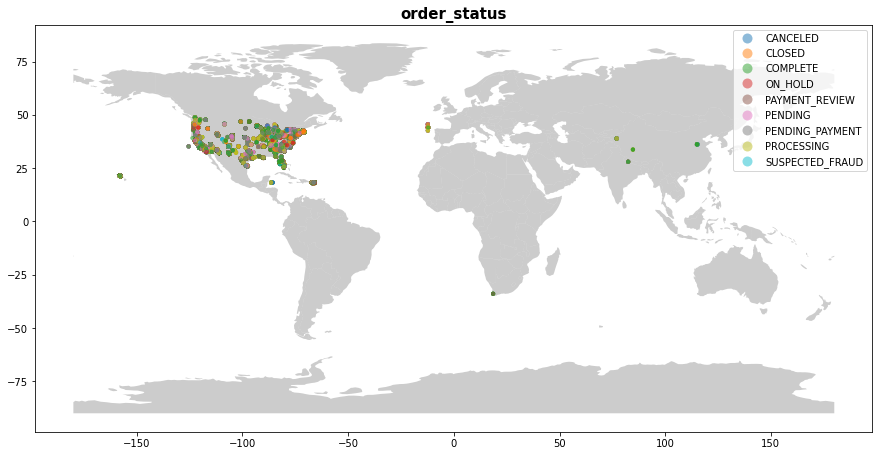

In [11]:
# create figure and axes, assign to subplot
fig, ax = plt.subplots(figsize=(15,15))

# add .shp mapfile to axes
street_map.plot(ax=ax, alpha=0.4,color='grey')

# add geodataframe to axes
# assign ‘price’ variable to represent coordinates on graph
# add legend
# make datapoints transparent using alpha
# assign size of points using markersize
geo_df.plot(column='order_status',ax=ax,alpha=0.5, legend=True,markersize= 10)

# add title to graph
plt.title('order_status', fontsize=15,fontweight='bold')
# set latitiude and longitude boundaries for map display
# plt.xlim()
# plt.ylim()
# show map
plt.show()

In [12]:
geo_df.explore(
     column="order_status", # make choropleth based 
#      tooltip="BoroName", # show "BoroName" value in tooltip (on hover)
     popup=True, # show all values in popup (on click)
     tiles="CartoDB positron", # use "CartoDB positron" tiles
     cmap="Set1", # use "Set1" matplotlib colormap
     style_kwds=dict(color="black") # use black outline
    )

KeyboardInterrupt: 

In [21]:
# nybb = gpd.read_file(geopandas.datasets.get_path('nybb'))
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
# cities = gpd.read_file(geopandas.datasets.get_path('naturalearth_cities'))


In [ ]:
nybb.explore(
     column="BoroName", # make choropleth based on "BoroName" column
     tooltip="BoroName", # show "BoroName" value in tooltip (on hover)
     popup=True, # show all values in popup (on click)
     tiles="CartoDB positron", # use "CartoDB positron" tiles
     cmap="Set1", # use "Set1" matplotlib colormap
     style_kwds=dict(color="black") # use black outline
    )

In [ ]:
from folium import plugins

map = folium.Map(location = [15,30],  zoom_start = 2)

heat_data = [[point.xy[1][0], point.xy[0][0]] for point in geo_df.geometry ]

heat_data
plugins.HeatMap(heat_data).add_to(map)

map

In [23]:
contiguous_usa = gpd.read_file('./maps/USA/states/cb_2018_us_state_500k.shp')

In [24]:
contiguous_usa.head(2)

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry
0,28,01779790,0400000US28,28,MS,Mississippi,00,121533519481,3926919758,"MULTIPOLYGON (((-88.50297 30.21523, -88.49176 ..."
1,37,01027616,0400000US37,37,NC,North Carolina,00,125923656064,13466071395,"MULTIPOLYGON (((-75.72681 35.93584, -75.71827 ..."


In [57]:
geo_df.rename(columns = {'geometry': 'geo'}, inplace = True)

In [ ]:
# Read in state population data and examine
# state_pop = pd.read_csv('data/state_pop_2018.csv')
# state_pop.head()

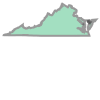

In [25]:
# get state
contiguous_usa.iloc[3]['geometry']

In [11]:
type(geo_df)
# world_happiness_final = world.merge(world_happiness, how="left", left_on=['name'], right_on=['Country or region'])

geopandas.geodataframe.GeoDataFrame

In [45]:
contiguous_usa

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry
0,28,01779790,0400000US28,28,MS,Mississippi,00,121533519481,3926919758,"MULTIPOLYGON (((-88.50297 30.21523, -88.49176 ..."
1,37,01027616,0400000US37,37,NC,North Carolina,00,125923656064,13466071395,"MULTIPOLYGON (((-75.72681 35.93584, -75.71827 ..."
2,40,01102857,0400000US40,40,OK,Oklahoma,00,177662925723,3374587997,"POLYGON ((-103.00257 36.52659, -103.00219 36.6..."
3,51,01779803,0400000US51,51,VA,Virginia,00,102257717110,8528531774,"MULTIPOLYGON (((-75.74241 37.80835, -75.74151 ..."
4,54,01779805,0400000US54,54,WV,West Virginia,00,62266474513,489028543,"POLYGON ((-82.64320 38.16909, -82.64300 38.169..."
5,22,01629543,0400000US22,22,LA,Louisiana,00,111897594374,23753621895,"MULTIPOLYGON (((-88.86770 29.86155, -88.86566 ..."
6,26,01779789,0400000US26,26,MI,Michigan,00,146600952990,103885855702,"MULTIPOLYGON (((-83.19159 42.03537, -83.18993 ..."
7,25,00606926,0400000US25,25,MA,Massachusetts,00,20205125364,7129925486,"MULTIPOLYGON (((-70.23405 41.28565, -70.22361 ..."
8,16,01779783,0400000US16,16,ID,Idaho,00,214049787659,2391722557,"POLYGON ((-117.24267 44.39655, -117.23484 44.3..."
9,12,00294478,0400000US12,12,FL,Florida,00,138949136250,31361101223,"MULTIPOLYGON (((-80.17628 25.52505, -80.17395 ..."


In [58]:
pop_states = contiguous_usa.merge(geo_df, left_on = 'STUSPS', right_on = 'customer_state')

In [53]:
pop_states['geometry_x'] = pop_states.GeoLocation.apply(lambda x: Point(eval(x)))

AttributeError: 'DataFrame' object has no attribute 'GeoLocation'

In [59]:
type(pop_states)

geopandas.geodataframe.GeoDataFrame

In [49]:
pop_states

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry_x,type,actual_ship_days,estimated_ship_days,delivery_status,late_delivery_risk,category_id,category_name,customer_city,customer_id,customer_segment,customer_state,customer_zipcode,department_name,latitude,longitude,market,order_city,order_country,order_date,order_id,order_item_discount_rate,order_item_profit_ratio,order_item_quantity,order_region,order_state,order_status,product_card_id,product_name,product_price,shipping_date,shipping_mode,geometry_y
0,37,01027616,0400000US37,37,NC,North Carolina,00,125923656064,13466071395,"MULTIPOLYGON (((-75.72681 35.93584, -75.71827 ...",DEBIT,2,4,Advance shipping,0,18,Men's Footwear,Greenville,7884,Corporate,NC,27858.0,Apparel,35.600349,-77.334869,Pacific Asia,Estambul,Turquï¿½a,2016-08-31 12:06:00,41686,0.04,0.33,1,West Asia,Estambul,COMPLETE,403,Nike Men's CJ Elite 2 TD Football Cleat,129.990005,2016-09-02 12:06:00,Standard Class,POINT (-77.33487 35.60035)
1,37,01027616,0400000US37,37,NC,North Carolina,00,125923656064,13466071395,"MULTIPOLYGON (((-75.72681 35.93584, -75.71827 ...",PAYMENT,2,1,Late delivery,1,73,Sporting Goods,Lenoir,19364,Consumer,NC,28645.0,Fitness,36.110199,-81.526009,Pacific Asia,Shantou,China,2018-01-11 15:37:00,75811,0.07,-0.24,1,Eastern Asia,Guangdong,PENDING_PAYMENT,1360,Smart watch,327.750000,2018-01-13 15:37:00,First Class,POINT (-81.52601 36.11020)
2,37,01027616,0400000US37,37,NC,North Carolina,00,125923656064,13466071395,"MULTIPOLYGON (((-75.72681 35.93584, -75.71827 ...",TRANSFER,5,4,Shipping canceled,0,24,Women's Apparel,Greensboro,2048,Consumer,NC,27410.0,Golf,36.087570,-79.886635,Europe,Strasbourg,Francia,2017-09-04 10:22:00,66959,0.01,0.28,4,Western Europe,Alsacia-Champaï¿½a-Ardenas-Lorena,CANCELED,502,Nike Men's Dri-FIT Victory Golf Polo,50.000000,2017-09-09 10:22:00,Standard Class,POINT (-79.88663 36.08757)
3,37,01027616,0400000US37,37,NC,North Carolina,00,125923656064,13466071395,"MULTIPOLYGON (((-75.72681 35.93584, -75.71827 ...",TRANSFER,6,4,Late delivery,1,17,Cleats,Raleigh,1240,Consumer,NC,27610.0,Apparel,35.811783,-78.597565,Europe,Siegen,Alemania,2017-07-10 07:38:00,63115,0.00,0.33,4,Western Europe,Renania del Norte-Westfalia,PENDING,365,Perfect Fitness Perfect Rip Deck,59.990002,2017-07-16 07:38:00,Standard Class,POINT (-78.59756 35.81178)
4,37,01027616,0400000US37,37,NC,North Carolina,00,125923656064,13466071395,"MULTIPOLYGON (((-75.72681 35.93584, -75.71827 ...",DEBIT,5,4,Late delivery,1,9,Cardio Equipment,Asheboro,10708,Consumer,NC,27203.0,Footwear,35.701115,-79.820251,Europe,Amsterdam,Paï¿½ses Bajos,2015-09-12 16:48:00,17449,0.13,0.11,5,Western Europe,Holanda Septentrional,COMPLETE,191,Nike Men's Free 5.0+ Running Shoe,99.989998,2015-09-17 16:48:00,Standard Class,POINT (-79.82025 35.70111)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180511,09,01779780,0400000US09,09,CT,Connecticut,00,12542497068,1815617571,"MULTIPOLYGON (((-72.76143 41.24233, -72.75973 ...",DEBIT,5,4,Late delivery,1,45,Fishing,Milford,1035,Consumer,CT,6460.0,Fan Shop,41.188702,-73.094734,Pacific Asia,Tamworth,Australia,2016-03-05 08:41:00,29414,0.12,0.10,1,Oceania,Nueva Gales del Sur,COMPLETE,1004,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,2016-03-10 08:41:00,Standard Class,POINT (-73.09473 41.18870)
180512,09,01779780,0400000US09,09,CT,Connecticut,00,12542497068,1815617571,"MULTIPOLYGON (((-72.76143 41.24233, -72.75973 ...",DEBIT,5,4,Late delivery,1,45,Fishing,Milford,460,Home Office,CT,6460.0,Fan Shop,41.267422,-73.264824,Pacific Asia,Xuzhou,China,2016-02-21 17:38:00,28549,0.05,0.07,1,Eastern Asia,Jiangsu,ON_HOLD,1004,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,2016-02-26 17:38:00,Standard Class,POINT (-73.26482 41.26742)
180513,09,01779780,0400000US09,09,CT,Connecticut,00,12542497068,1815617571,"MULTIPOLYGON (((-72.76143 41.24233, -72.75973 ...",DEBIT,4,2,

In [27]:
pop_states = pop_states.loc[pop_states['NAME'].isin(['AL', 'HA'])]

In [78]:
mixed = pop_states[0:100_000]

In [79]:
import json
from bokeh.io import show
from bokeh.models import (CDSView, ColorBar, ColumnDataSource,
                          CustomJS, CustomJSFilter, 
                          GeoJSONDataSource, HoverTool,
                          LinearColorMapper, Slider)
from bokeh.layouts import column, row, widgetbox
from bokeh.palettes import brewer
from bokeh.plotting import figure

In [124]:
# pop_geojson = pop_states.to_json('temp.json', orient='records', lines=True)

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported b

OverflowError: Maximum recursion level reached

In [122]:
# pop_geojson = pop_states.to_json()

/Users/SeanMcNamara/opt/anaconda3/lib/python3.7/site-packages/pandas/io/json/_json.py:167: ShapelyDeprecationWarning:

The 'array_interface_base' property is deprecated and will be removed in Shapely 2.0.

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCollection

IllegalArgumentException: Operation not supported by GeometryCol

OverflowError: Maximum recursion level reached

In [132]:
# Input GeoJSON source that contains features for plotting
# geosource = GeoJSONDataSource(geojson = contiguous_usa.to_json())

In [120]:
# geo_df.to_file("output.json", driver="GeoJSON")

KeyboardInterrupt: 

In [123]:
# boros = geopandas.GeoDataFrame.from_file('../Téléchargements/nybb_14a_av/nybb.shp')
# boros.geometry.to_json()
# pop_states.geometry.__geo_interface__

AttributeError: 'DataFrame' object has no attribute 'geometry'

In [61]:
# Create figure object.
p = figure(title = 'Lead Levels in Water Samples, 2018', 
           plot_height = 600 ,
           plot_width = 950, 
           toolbar_location = 'below',
           tools = 'pan, wheel_zoom, box_zoom, reset')
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None
# Add patch renderer to figure.
states = p.patches('xs','ys', source = geosource,
                   fill_color = None,
                   line_color = 'gray', 
                   line_width = 0.25, 
                   fill_alpha = 1)

# Create hover tool
p.add_tools(HoverTool(renderers = [states],
                      tooltips = [('State','@NAME'),
                                ('Population','STATENS')]))
show(p)

NameError: name 'geosource' is not defined

In [15]:
from bokeh.plotting import figure,show
from bokeh.models import HoverTool
import hvplot.pandas

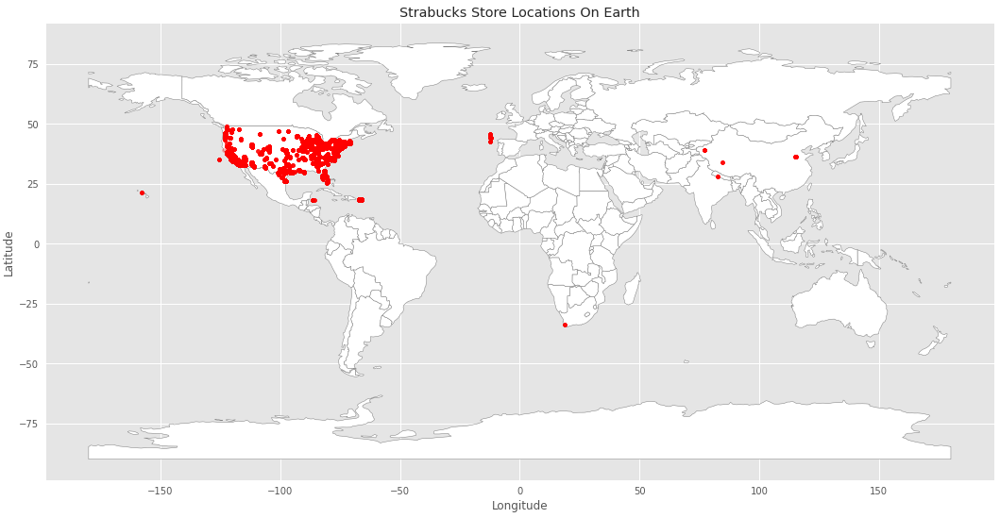

In [22]:
with plt.style.context(("seaborn", "ggplot")):
    world.plot(figsize=(18,10),
               color="white",
               edgecolor = "grey");

    plt.scatter(geo_df.longitude, geo_df.latitude, s=15, color="red", alpha=0.3)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title("Strabucks Store Locations On Earth");

In [ ]:
mixed.plot("actual_ship_days",
                           figsize=(18,10),
                           legend=True,
#                             legend_kwds={"label":"order_item_profit_ratio"},
                           cmap=plt.cm.Greens,
                          )
plt.title("World Happiness Report");

In [ ]:
# mixed.hvplot(c="actual_ship_days",
#                              cmap="BrBG",
#                              hover_fill_color="red",
#                              width=900,height=500,
#                              title="World Happiness Report",
#                             )

In [8]:
from bokeh.models import *
from bokeh.plotting import *
from bokeh.io import *
from bokeh.tile_providers import *
from bokeh.palettes import *
from bokeh.transform import *
from bokeh.layouts import *

In [43]:
df.head(2)

,type,actual_ship_days,estimated_ship_days,delivery_status,late_delivery_risk,category_id,category_name,customer_city,customer_id,customer_segment,customer_state,customer_zipcode,department_name,latitude,longitude,market,order_city,order_country,order_date,order_id,order_item_discount_rate,order_item_profit_ratio,order_item_quantity,order_region,order_state,order_status,product_card_id,product_name,product_price,shipping_date,shipping_mode
0,DEBIT,3,4,Advance shipping,0,73,Sporting Goods,Caguas,20755,Consumer,PR,725.0,Fitness,18.251453,-66.037056,Pacific Asia,Bekasi,Indonesia,2018-01-31 22:56:00,77202,0.04,0.29,1,Southeast Asia,Java Occidental,COMPLETE,1360,Smart watch,327.75,2018-02-03 22:56:00,Standard Class
1,TRANSFER,5,4,Late delivery,1,73,Sporting Goods,Caguas,19492,Consumer,PR,725.0,Fitness,18.279451,-66.037064,Pacific Asia,Bikaner,India,2018-01-13 12:27:00,75939,0.05,-0.80,1,South Asia,Rajastï¿½n,PENDING,1360,Smart watch,327.75,2018-01-18 12:27:00,Standard Class


In [42]:
df.drop(labels = 'geometry', axis = 1)

KeyError: "['geometry'] not found in axis"

In [44]:
def wgs84_to_web_mercator(df, lon, lat):
    """Converts decimal longitude/latitude to Web Mercator format"""
    k = 6378137
    df["x"] = df[lon] * (k * np.pi/180.0)
    df["y"] = np.log(np.tan((90 + df[lat]) * np.pi/360.0)) * k
    return df

df=wgs84_to_web_mercator(geo_df,'longitude','latitude')

In [45]:

scale=2000
x=df['x']
y=df['y']

#The range for the map extents is derived from the lat/lon fields. This way the map is automatically centered on the plot elements.

x_min=int(x.mean() - (scale * 350))
x_max=int(x.mean() + (scale * 350))
y_min=int(y.mean() - (scale * 350))
y_max=int(y.mean() + (scale * 350))

#Defining the map tiles to use. I use OSM, but you can also use ESRI images or google street maps.

tile_provider=get_provider(OSM)

#Establish the bokeh plot object and add the map tile as an underlay. Hide x and y axis.

plot=figure(
    title='2019 Iraq Conflict Events',
    match_aspect=True,
    tools='wheel_zoom,pan,reset,save',
    x_range=(x_min, x_max),
    y_range=(y_min, y_max),
    x_axis_type='mercator',
    y_axis_type='mercator'
    )

plot.grid.visible=True

map=plot.add_tile(tile_provider)
map.level='underlay'

plot.xaxis.visible = False
plot.yaxis.visible=False

#If in Jupyter, use the output_notebook() method to display the plot in-line. If not, you can use output_file() or another method to save your map. 
output_notebook()

Loading BokehJS ...

In [46]:
def hex_map(plot,df, scale,leg_label='Hexbin Heatmap'):
  r,bins=plot.hexbin(x,y,size=scale*10,hover_color='pink',hover_alpha=0.8,legend_label=leg_label)
  hex_hover = HoverTool(tooltips=[('count','@c')],mode='mouse',point_policy='follow_mouse',renderers=[r])
  hex_hover.renderers.append(r)
  plot.tools.append(hex_hover)
  
  plot.legend.location = "top_right"
  plot.legend.click_policy="hide"

In [47]:
def bubble_map(plot,df,radius_col,lon,lat,scale,color='orange',leg_label='Bubble Map'):
  radius=[]
  for i in df[radius_col]:
    radius.append(i*scale)
  
  df['radius']=radius
    
  source=ColumnDataSource(df)
  c=plot.circle(x='x',y='y',color=color,source=source,size=1,fill_alpha=0.4,radius='radius',legend_label=leg_label,hover_color='red')

  tip_label='@'+radius_col
  lat_label='@'+lat
  lon_label='@'+lon

  circle_hover = HoverTool(tooltips=[(radius_col,tip_label),('Lat:',lat_label),('Lon:',lon_label)],mode='mouse',point_policy='follow_mouse',renderers=[c])
  circle_hover.renderers.append(c)
  plot.tools.append(circle_hover)

#The legend.click_policy method allows us to toggle layer on/off by clicking the corresponding field in the legend. We'll explore this more later!
  plot.legend.location = "top_right"
  plot.legend.click_policy="hide"

In [48]:
hex_map(plot=plot,
        df=geo_df, 
        scale=scale,
        leg_label='Iraq Conflict Events by Number of Events')

#Create the bubble map. In this case, circle radius is defined by the amount of fatalities. Any column can be chosen to define the radius.
bubble_map(plot=plot,
           df=geo_df,
           radius_col='actual_ship_days', 
           leg_label='Iraq Conflict Events by Fatality',
           lon='longitude',
           lat='latitude',
           scale=scale)

#let's see our handiwork!
show(plot)

TypeError: Object of type Point is not JSON serializable

In [74]:
conflict_df=pd.read_csv('https://raw.githubusercontent.com/ConnerBrew/Iraq-Conflict-Data/master/conflict_data_irq.csv')

In [4]:
conflict_df=conflict_df.loc[conflict_df['year'] == '2019']
conflict_df['latitude']=conflict_df['latitude'].astype('float')
conflict_df['longitude']=conflict_df['longitude'].astype('float')
conflict_df['fatalities']=conflict_df['fatalities'].astype('int64')
conflict_df=conflict_df.reset_index()
conflict_df=conflict_df.drop('index',axis=1)

In [49]:
df.head(2)

,type,actual_ship_days,estimated_ship_days,delivery_status,late_delivery_risk,category_id,category_name,customer_city,customer_id,customer_segment,customer_state,customer_zipcode,department_name,latitude,longitude,market,order_city,order_country,order_date,order_id,order_item_discount_rate,order_item_profit_ratio,order_item_quantity,order_region,order_state,order_status,product_card_id,product_name,product_price,shipping_date,shipping_mode,geometry,x,y,radius
0,DEBIT,3,4,Advance shipping,0,73,Sporting Goods,Caguas,20755,Consumer,PR,725.0,Fitness,18.251453,-66.037056,Pacific Asia,Bekasi,Indonesia,2018-01-31 22:56:00,77202,0.04,0.29,1,Southeast Asia,Java Occidental,COMPLETE,1360,Smart watch,327.75,2018-02-03 22:56:00,Standard Class,POINT (-66.03706 18.25145),-7.351211e+06,2.067002e+06,6000
1,TRANSFER,5,4,Late delivery,1,73,Sporting Goods,Caguas,19492,Consumer,PR,725.0,Fitness,18.279451,-66.037064,Pacific Asia,Bikaner,India,2018-01-13 12:27:00,75939,0.05,-0.80,1,South Asia,Rajastï¿½n,PENDING,1360,Smart watch,327.75,2018-01-18 12:27:00,Standard Class,POINT (-66.03706 18.27945),-7.351212e+06,2.070284e+06,10000


In [58]:
df.drop(labels = 'geometry', axis = 1)

,type,actual_ship_days,estimated_ship_days,delivery_status,late_delivery_risk,category_id,category_name,customer_city,customer_id,customer_segment,customer_state,customer_zipcode,department_name,latitude,longitude,market,order_city,order_country,order_date,order_id,order_item_discount_rate,order_item_profit_ratio,order_item_quantity,order_region,order_state,order_status,product_card_id,product_name,product_price,shipping_date,shipping_mode,x,y,radius
0,DEBIT,3,4,Advance shipping,0,73,Sporting Goods,Caguas,20755,Consumer,PR,725.0,Fitness,18.251453,-66.037056,Pacific Asia,Bekasi,Indonesia,2018-01-31 22:56:00,77202,0.04,0.29,1,Southeast Asia,Java Occidental,COMPLETE,1360,Smart watch,327.750000,2018-02-03 22:56:00,Standard Class,-7.351211e+06,2.067002e+06,6000
1,TRANSFER,5,4,Late delivery,1,73,Sporting Goods,Caguas,19492,Consumer,PR,725.0,Fitness,18.279451,-66.037064,Pacific Asia,Bikaner,India,2018-01-13 12:27:00,75939,0.05,-0.80,1,South Asia,Rajastï¿½n,PENDING,1360,Smart watch,327.750000,2018-01-18 12:27:00,Standard Class,-7.351212e+06,2.070284e+06,10000
2,CASH,4,4,Shipping on time,0,73,Sporting Goods,San Jose,19491,Consumer,CA,95125.0,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,2018-01-13 12:06:00,75938,0.06,-0.80,1,South Asia,Rajastï¿½n,CLOSED,1360,Smart watch,327.750000,2018-01-17 12:06:00,Standard Class,-1.356776e+07,4.479919e+06,8000
3,DEBIT,3,4,Advance shipping,0,73,Sporting Goods,Los Angeles,19490,Home Office,CA,90027.0,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,2018-01-13 11:45:00,75937,0.07,0.08,1,Oceania,Queensland,COMPLETE,1360,Smart watch,327.750000,2018-01-16 11:45:00,Standard Class,-1.316810e+07,4.045726e+06,6000
4,PAYMENT,2,4,Advance shipping,0,73,Sporting Goods,Caguas,19489,Corporate,PR,725.0,Fitness,18.253769,-66.037048,Pacific Asia,Townsville,Australia,2018-01-13 11:24:00,75936,0.09,0.45,1,Oceania,Queensland,PENDING_PAYMENT,1360,Smart watch,327.750000,2018-01-15 11:24:00,Standard Class,-7.351211e+06,2.067273e+06,4000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180514,CASH,4,4,Shipping on time,0,45,Fishing,Brooklyn,1005,Home Office,NY,11207.0,Fan Shop,40.640930,-73.942711,Pacific Asia,Shanghï¿½i,China,2016-01-16 03:40:00,26043,0.00,0.10,1,Eastern Asia,Shanghï¿½i,CLOSED,1004,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,2016-01-20 03:40:00,Standard Class,-8.231265e+06,4.959522e+06,8000
180515,DEBIT,3,2,Late delivery,1,45,Fishing,Bakersfield,9141,Corporate,CA,93304.0,Fan Shop,35.362545,-119.018700,Pacific Asia,Hirakata,Japï¿½n,2016-01-16 01:34:00,26037,0.01,-1.55,1,Eastern Asia,Osaka,COMPLETE,1004,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,2016-01-19 01:34:00,Second Class,-1.324910e+07,4.213259e+06,6000
180516,TRANSFER,5,4,Late delivery,1,45,Fishing,Bristol,291,Corporate,CT,6010.0,Fan Shop,41.629959,-72.967155,Pacific Asia,Adelaide,Australia,2016-01-15 21:00:00,26024,0.02,0.36,1,Oceania,Australia del Sur,PENDING,1004,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,2016-01-20 21:00:00,Standard Class,-8.122667e+06,5.105709e+06,10000
180517,PAYMENT,3,4,Advance shipping,0,45,Fishing,Caguas,2813,Consumer,PR,725.0,Fan Shop,18.213350,-66.370575,Pacific Asia,Adelaide,Australia,2016-01-15 20:18:00,26022,0.03,0.48,1,Oceania,Australia del Sur,PENDING_PAYMENT,1004,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,2016-01-18 20:18:00,Standard Class,-7.388339e+06,2.062536e+06,6000


In [59]:
def wgs84_to_web_mercator(df, lon, lat):
    """Converts decimal longitude/latitude to Web Mercator format"""
    k = 6378137
    df["x"] = df[lon] * (k * np.pi/180.0)
    df["y"] = np.log(np.tan((90 + df[lat]) * np.pi/360.0)) * k
    return df

df=wgs84_to_web_mercator(df,'longitude','latitude')

In [60]:
scale=2000
x=df['x']
y=df['y']

#The range for the map extents is derived from the lat/lon fields. This way the map is automatically centered on the plot elements.

x_min=int(x.mean() - (scale * 350))
x_max=int(x.mean() + (scale * 350))
y_min=int(y.mean() - (scale * 350))
y_max=int(y.mean() + (scale * 350))

#Defining the map tiles to use. I use OSM, but you can also use ESRI images or google street maps.

tile_provider=get_provider(OSM)

#Establish the bokeh plot object and add the map tile as an underlay. Hide x and y axis.

plot=figure(
    title='2019 Iraq Conflict Events',
    match_aspect=True,
    tools='wheel_zoom,pan,reset,save',
    x_range=(x_min, x_max),
    y_range=(y_min, y_max),
    x_axis_type='mercator',
    y_axis_type='mercator'
    )

plot.grid.visible=True

map=plot.add_tile(tile_provider)
map.level='underlay'

plot.xaxis.visible = False
plot.yaxis.visible=False

#If in Jupyter, use the output_notebook() method to display the plot in-line. If not, you can use output_file() or another method to save your map. 
output_notebook()

Loading BokehJS ...

In [64]:
df.head()

,type,actual_ship_days,estimated_ship_days,delivery_status,late_delivery_risk,category_id,category_name,customer_city,customer_id,customer_segment,customer_state,customer_zipcode,department_name,latitude,longitude,market,order_city,order_country,order_date,order_id,order_item_discount_rate,order_item_profit_ratio,order_item_quantity,order_region,order_state,order_status,product_card_id,product_name,product_price,shipping_date,shipping_mode,geometry,x,y,radius
0,DEBIT,3,4,Advance shipping,0,73,Sporting Goods,Caguas,20755,Consumer,PR,725.0,Fitness,18.251453,-66.037056,Pacific Asia,Bekasi,Indonesia,2018-01-31 22:56:00,77202,0.04,0.29,1,Southeast Asia,Java Occidental,COMPLETE,1360,Smart watch,327.75,2018-02-03 22:56:00,Standard Class,POINT (-66.03706 18.25145),-7.351211e+06,2.067002e+06,6000
1,TRANSFER,5,4,Late delivery,1,73,Sporting Goods,Caguas,19492,Consumer,PR,725.0,Fitness,18.279451,-66.037064,Pacific Asia,Bikaner,India,2018-01-13 12:27:00,75939,0.05,-0.80,1,South Asia,Rajastï¿½n,PENDING,1360,Smart watch,327.75,2018-01-18 12:27:00,Standard Class,POINT (-66.03706 18.27945),-7.351212e+06,2.070284e+06,10000
2,CASH,4,4,Shipping on time,0,73,Sporting Goods,San Jose,19491,Consumer,CA,95125.0,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,2018-01-13 12:06:00,75938,0.06,-0.80,1,South Asia,Rajastï¿½n,CLOSED,1360,Smart watch,327.75,2018-01-17 12:06:00,Standard Class,POINT (-121.88128 37.29223),-1.356776e+07,4.479919e+06,8000
3,DEBIT,3,4,Advance shipping,0,73,Sporting Goods,Los Angeles,19490,Home Office,CA,90027.0,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,2018-01-13 11:45:00,75937,0.07,0.08,1,Oceania,Queensland,COMPLETE,1360,Smart watch,327.75,2018-01-16 11:45:00,Standard Class,POINT (-118.29102 34.12595),-1.316810e+07,4.045726e+06,6000
4,PAYMENT,2,4,Advance shipping,0,73,Sporting Goods,Caguas,19489,Corporate,PR,725.0,Fitness,18.253769,-66.037048,Pacific Asia,Townsville,Australia,2018-01-13 11:24:00,75936,0.09,0.45,1,Oceania,Queensland,PENDING_PAYMENT,1360,Smart watch,327.75,2018-01-15 11:24:00,Standard Class,POINT (-66.03705 18.25377),-7.351211e+06,2.067273e+06,4000


In [22]:
df = pd.read_csv('./data/ship_clean.csv', encoding= 'unicode_escape')

In [23]:
df2 = df[['actual_ship_days', 'latitude', 'longitude']]

In [24]:
df2['latitude']=df2['latitude'].astype('float')
df2['longitude']=df2['longitude'].astype('float')
df2['fatalities']=df2['actual_ship_days'].astype('int64')
df2=df2.reset_index()

/Users/SeanMcNamara/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/SeanMcNamara/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/SeanMcNamara/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the c

In [25]:
df2=df2.drop('index',axis=1)

In [26]:
def wgs84_to_web_mercator(df, lon, lat):
    """Converts decimal longitude/latitude to Web Mercator format"""
    k = 6378137
    df["x"] = df[lon] * (k * np.pi/180.0)
    df["y"] = np.log(np.tan((90 + df[lat]) * np.pi/360.0)) * k
    return df

df=wgs84_to_web_mercator(df2,'longitude','latitude')

In [27]:

scale=2000
x=df['x']
y=df['y']

#The range for the map extents is derived from the lat/lon fields. This way the map is automatically centered on the plot elements.

x_min=int(x.mean() - (scale * 350))
x_max=int(x.mean() + (scale * 350))
y_min=int(y.mean() - (scale * 350))
y_max=int(y.mean() + (scale * 350))

#Defining the map tiles to use. I use OSM, but you can also use ESRI images or google street maps.

tile_provider=get_provider(OSM)

#Establish the bokeh plot object and add the map tile as an underlay. Hide x and y axis.

plot=figure(
    title='2019 Iraq Conflict Events',
    match_aspect=True,
    tools='wheel_zoom,pan,reset,save',
    x_range=(x_min, x_max),
    y_range=(y_min, y_max),
    x_axis_type='mercator',
    y_axis_type='mercator'
    )

plot.grid.visible=True

map=plot.add_tile(tile_provider)
map.level='underlay'

plot.xaxis.visible = False
plot.yaxis.visible=False

#If in Jupyter, use the output_notebook() method to display the plot in-line. If not, you can use output_file() or another method to save your map. 
output_notebook()

Loading BokehJS ...

In [28]:
#function takes a column to determine radius and the dataframe with converted mercator coordinates to create a bubble map. 
def hex_map(plot,df, scale,leg_label='Hexbin Heatmap'):
  r,bins=plot.hexbin(x,y,size=scale*10,hover_color='pink',hover_alpha=0.8,legend_label=leg_label)
  hex_hover = HoverTool(tooltips=[('count','@c')],mode='mouse',point_policy='follow_mouse',renderers=[r])
  hex_hover.renderers.append(r)
  plot.tools.append(hex_hover)
  
  plot.legend.location = "top_right"
  plot.legend.click_policy="hide"

In [29]:
#function takes a column to determine radius and the dataframe with converted mercator coordinates to create a bubble map. 
def bubble_map(plot,df,radius_col,lon,lat,scale,color='orange',leg_label='Bubble Map'):
  radius=[]
  for i in df[radius_col]:
    radius.append(i*scale)
  
  df['radius']=radius
    
  source=ColumnDataSource(df)
  c=plot.circle(x='x',y='y',color=color,source=source,size=1,fill_alpha=0.4,radius='radius',legend_label=leg_label,hover_color='red')

  tip_label='@'+radius_col
  lat_label='@'+lat
  lon_label='@'+lon

  circle_hover = HoverTool(tooltips=[(radius_col,tip_label),('Lat:',lat_label),('Lon:',lon_label)],mode='mouse',point_policy='follow_mouse',renderers=[c])
  circle_hover.renderers.append(c)
  plot.tools.append(circle_hover)

#The legend.click_policy method allows us to toggle layer on/off by clicking the corresponding field in the legend. We'll explore this more later!
  plot.legend.location = "top_right"
  plot.legend.click_policy="hide"

In [30]:
#Create the hexbin map
hex_map(plot=plot,
        df=df2, 
        scale=scale,
        leg_label='Actual Shipping days')

#Create the bubble map. In this case, circle radius is defined by the amount of fatalities. Any column can be chosen to define the radius.
bubble_map(plot=plot,
           df=df2,
           radius_col='actual_ship_days', 
           leg_label='Number of orders',
           lon='longitude',
           lat='latitude',
           scale=scale)

#let's see our handiwork!
show(plot)

In [31]:
df.head(2)

,actual_ship_days,latitude,longitude,fatalities,x,y,radius
0,3,18.251453,-66.037056,3,-7.351211e+06,2.067002e+06,6000
1,5,18.279451,-66.037064,5,-7.351212e+06,2.070284e+06,10000


In [17]:
import plotly.express as px

In [18]:
df = px.data.gapminder()
fig = px.scatter_geo(df, locations="iso_alpha", color="continent",
                     hover_name="country", size="pop",
#                      animation_frame="year",
                     projection="natural earth")
fig.show()

# Quick EDA

## Fraud Detection 

<AxesSubplot:title={'center':'order_country'}>

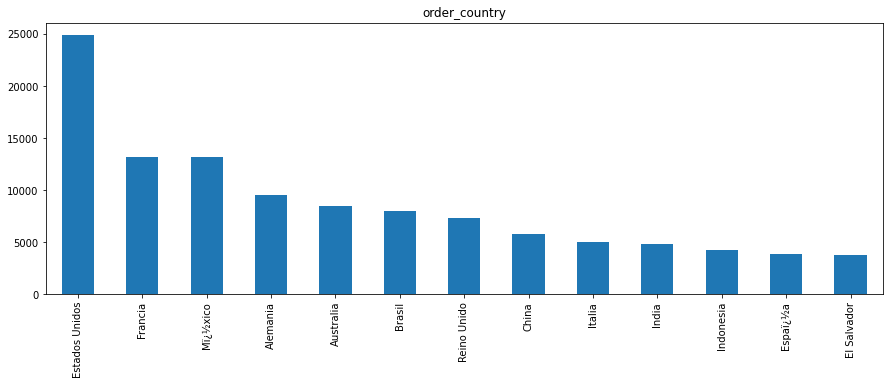

In [79]:
df['order_country'].value_counts().nlargest(13).plot.bar(figsize=(15,7), title="order_country")

<AxesSubplot:title={'center':'Countries with high fraud'}>

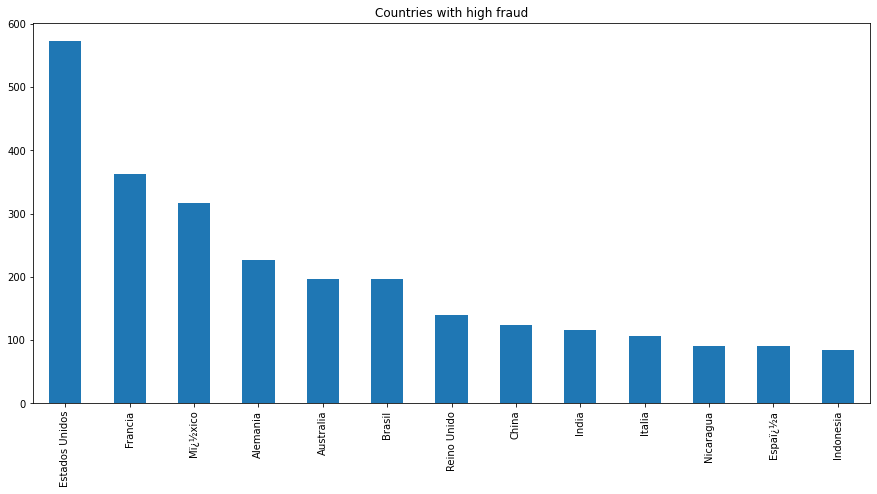

In [81]:
suspected_df = df[df['order_status']=='SUSPECTED_FRAUD']
suspected_countries = suspected_df['order_country'].value_counts().nlargest(13)
suspected_countries.plot.bar(figsize=(15,7), title= "Countries with high fraud")